## Skeleton of SDAP client benchmarking MSLSP algorithm requests

The notebook is extracting 2 years time series of every pixel of tile T18TYN

# Import

In [1]:
%matplotlib inline
import mpld3
mpld3.enable_notebook()
import numpy as np
import requests
import ray
import time
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter, YearLocator
from datetime import datetime
from multiprocessing import Pool
from functools import partial
import warnings
warnings.filterwarnings('ignore')

### Ray.io initialization.

The ray call are not used yet but will be to ditribute the chunk processing. The current algorithm is only pulling one chunk in parallel on a single node.

In [2]:
# ray.init(ignore_reinit_error=True)
# can use that to work with the JPL VPN on, don't know what to put as address though...
ray.init(_node_ip_address='192.168.1.165', ignore_reinit_error=True)

2021-09-28 10:25:01,663	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265


{'node_ip_address': '192.168.1.165',
 'raylet_ip_address': '192.168.1.165',
 'redis_address': '192.168.1.165:6379',
 'object_store_address': '/tmp/ray/session_2021-09-28_10-24-59_644179_7740/sockets/plasma_store',
 'raylet_socket_name': '/tmp/ray/session_2021-09-28_10-24-59_644179_7740/sockets/raylet',
 'webui_url': '127.0.0.1:8265',
 'session_dir': '/tmp/ray/session_2021-09-28_10-24-59_644179_7740',
 'metrics_export_port': 61384,
 'node_id': 'f9a4c7092965246c65ceffc77aeeade4fc9f64664b1d564fc91ff6bb'}

### Timeseries individual request (ie for one grid chunk)

In [3]:
def lat_lon2hash5(lat, lon):
    return f'{lat:0.5f}_{lon:0.5f}'

def hash52lat_lon(hash):
 lat_lon = hash.split('_')
 return float(lat_lon[0]), float(lat_lon[1])


def extract_time_series(sdap_response, multi_band=True):
    time_series = {}
   
    # assemble time series per location
    for p in sdap_response['data']:
        hash5 = lat_lon2hash5(p['latitude'], p['longitude'])
        if not hash5 in time_series.keys():
            time_series[hash5] = []
        
        if multi_band:
            measurement = {'time': datetime.fromtimestamp(p['time']), 
                                       'mb_vector': p['data'][0]['variable'],
                                       'evi': p['data'][0]['evi']
                                      }
        else:
            measurement = {'time': datetime.fromtimestamp(p['time']), 
                                       'variable': p['data'][0]['variable'],
                                      }
            
        time_series[hash5].append(measurement)
    
    if multi_band:
        if 'var_name' in sdap_response['meta']:
            mb_vars = eval(sdap_response['meta']['var_name']) # the array is a string because of backward compatibility with mono band datasets
        else:
            return None
    
    # sort time series & transpose to plot easily  
    for k, ts in time_series.items():
        ts.sort(key=lambda x: x['time'])
        variable = 'evi' if multi_band else 'variable'
        ts_transp = {'t': [v['time'] for v in ts],
              variable:[v[variable] for v in ts],
            }
        
        # add multiband data
        if multi_band:
            i = 0
            for var in mb_vars:
               ts_transp[var] = [v['mb_vector'][i] for v in ts]
               i+=1
        
        time_series[k] = ts_transp
    
    return time_series
        


def getTimeSeries(
        lat_min,
        lon_min,
        lat_max,
        lon_max,
        start_time=datetime(2016, 7, 1),
        end_time=datetime(2018, 6, 30),
        base_url="https://oceanworks.jpl.nasa.gov", 
        dataset="HLS.L30.T18TYN",
        multi_band=True
        
    ):

    # ISO-8601 date format
    dt_format = "%Y-%m-%dT%H:%M:%SZ"

    #try:
    url = '{}/datainboundsmb?ds={}&b={},{},{},{}&startTime={}&endTime={}'.\
        format(base_url, dataset, lon_min , lat_min, lon_max, lat_max,
               start_time.strftime(dt_format), end_time.strftime(dt_format))
    print(url)
    #session = requests.Session()
    response = requests.get(url)
    #print(response)
    if response.status_code == 200:
        sdap_response = response.json()
        ts = extract_time_series(sdap_response, multi_band=multi_band)
        return ts
    else:
        return None


def phenology_place_holder(ts):
    ## simple mean and count 
    means = {}
    for key, loc_ts in ts.items():
        means[key] = {}
        for var, values in loc_ts.items():
            if var!='t':
                means[key][var] = np.mean([val for val in values if val])
        means[key]['meas_count'] = len(loc_ts['t'])
            
    return means


### split area of interest in chuncks

In [4]:
def split_area_in_chunks(lat_range, lon_range, number_of_chunk_square_root):
    bboxes = []
    number_of_chunk_square_root = 200
    lat_edge = (lat_range[1]-lat_range[0])/number_of_chunk_square_root
    lon_edge = (lon_range[1]-lon_range[0])/number_of_chunk_square_root
    i = 0
    for lat in np.arange(lat_range[0], lat_range[1], lat_edge):
        bboxes.append([])
        for lon in np.arange(lon_range[0], lon_range[1], lon_edge):   
            bboxes[i].append([
                lat, 
                lon,
                lat + lat_edge,
                lon + lon_edge
            ])
        i+=1
    return bboxes

### Restructuration of the answer for easy plot

In [5]:

def lat_lon_measurement_array(means):    
    grid_points = []
    measurements = {}
    for k, values in means.items():
        lat, lon = hash52lat_lon(k)
        grid_points.append([lat, lon]) 
        for var, value in values.items():
            if var not in measurements:
                measurements[var] = []
            measurements[var].append(value)
    return grid_points, measurements

def twodmesh_array(grid_points, measurements):
    
    lat_lon = np.transpose(grid_points)
    lats = sorted(np.unique(lat_lon[0]))
    lons = sorted(np.unique(lat_lon[1]))
    
    #plt.scatter(lat_lon[1], lat_lon[0], s=0.2, c=measurements['evi'], vmin=-3, vmax=3)
    
    var_matrices = {}
    i = 0
    for lat in lats:
        j = 0
        for lon in lons:
            hash5 = lat_lon2hash5(lat,lon)
            if hash5 in means:
                for var, value in means[hash5].items():
                    if var not in var_matrices:
                        var_matrices[var] = np.empty([len(lats), len(lons)])
                        var_matrices[var][:] = np.NaN
                    var_matrices[var][i, j] = value
            j+=1
        i+=1
        
    return lats, lons, var_matrices


def plottable_structure(means):
    grid_points, measurements = lat_lon_measurement_array(means)
    return twodmesh_array(grid_points, measurements)

### Function fetching the chunck EVI time series and computing average on EVI

In [6]:
@ray.remote
def get_and_process_tseries_mb_distributed(lat_min, lon_min, lat_max, lon_max):
    ts = getTimeSeries(
        lat_min, lon_min, lat_max, lon_max,
        start_time=datetime(2017, 1, 1),
        end_time=datetime(2019, 12, 31),
        base_url="https://oceanworks.jpl.nasa.gov",
        dataset="hls.preprocessed-m201",
        multi_band=True)
    if ts:
        return phenology_place_holder(ts)
    else:
        return None

### Launch the extraction and compute averages on each pixel on 2 years time series

We split the geographical range into 122*122 bounding boxes and apply extraction and average computation on pixels through ray.io. 
The bounding box match the size of the chunks in SDAP.

In [7]:
t_start = time.time()

lat_range = [43.3261171080151, 42.302597437408]
lon_range = [-72.5725144474117, -71.1820663001426]

bboxes = split_area_in_chunks(lat_range, lon_range, 122)

chunk_means = ray.get([get_and_process_tseries_mb_distributed.remote(*bbox) for bboxes_line in bboxes[40:50] for bbox in bboxes_line[40:50]])

duration = time.time() - t_start
print(f'{duration} seconds')

(pid=7856, ip=128.149.240.253) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m201&b=-72.28052033648545,43.11629557554052,-72.27356809574911,43.11117797718748&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=7869, ip=128.149.240.253) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m201&b=-72.28747257722179,43.11629557554052,-72.28052033648545,43.11117797718748&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=7865, ip=128.149.240.253) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m201&b=-72.29442481795813,43.11629557554052,-72.28747257722179,43.11117797718748&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=7863, ip=128.149.240.253) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m201&b=-72.23880689206742,43.12141317389356,-72.23185465133108,43.11629557554052&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=7862, ip=128.149.240.253) https://ocean

KeyboardInterrupt: 

(pid=7863, ip=128.149.240.253) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m201&b=-72.23880689206742,43.10606037883444,-72.23185465133108,43.100942780481404&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=7857, ip=128.149.240.253) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m201&b=-72.24575913280376,43.10606037883444,-72.23880689206742,43.100942780481404&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=7860, ip=128.149.240.253) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m201&b=-72.23185465133108,43.10606037883444,-72.22490241059474,43.100942780481404&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=7866, ip=128.149.240.253) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m201&b=-72.28747257722179,43.100942780481404,-72.28052033648545,43.095825182128365&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=7870, ip=128.149.240.253) https://

### Merge the ray.io results

In [25]:
means = {}
for chunck_mean in chunk_means:
    if chunck_mean:
        means.update(chunck_mean)

print(f"total number of pixel time series processed is {len(means.keys())}")

total number of pixel time series processed is 33136


### Plot the result

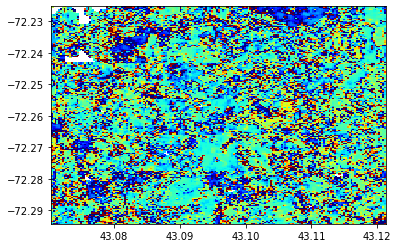

In [26]:
lons, lats, var_matrices = plottable_structure(means)
plt.pcolormesh(lons, lats, var_matrices['evi'], vmin=-5, vmax=5, cmap='jet')

In [17]:
chunk_means

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]